In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.decomposition import PCA
import pandas as pd
from scipy import signal

In [3]:
def load_data(filename):
    raw = np.genfromtxt(filename, delimiter=',')
    raw = raw[:, :-1]
    #print(raw)
    #print(raw.shape)
    return raw

def pre_ave_std(raw):
    ave = np.mean(raw, axis=0)
    std = np.std(raw, axis=0)
    de = []
    for i in range(raw.shape[0]):
        for j in range(raw.shape[1]):
            if (raw[i][j] > (ave[j] + 3 * std[j])) | (raw[i][j] < (ave[j] - 3 * std[j])):
                de.append(i)
                break
    preprocess = np.delete(raw, de, 0)
    print(preprocess.shape)
    return preprocess

    # new
def pre_slope_std(raw):
    std = np.std(raw, axis=0)
    de = []
    i = 0
    i_max = raw.shape[0]
    i_flag = 0
    i_tf = False
    while i < i_max - 1:
        for j in range(raw.shape[1]):
            if abs(raw[i + 1][j] - raw[i_flag][j]) > 3 * std[j] :
                de.append(i + 1)
                i_tf = True
                break
        i = i + 1
        if not i_tf:
            i_flag = i
        i_tf = False
            
    preprocess = np.delete(raw, de, 0)
    #print(preprocess.shape)
    return preprocess

def draw(raw, preprocess):
    print(raw.shape, preprocess.shape)
    plt.figure(2, figsize=(20,16))
    plt.subplot(211)
    f1 = plt.plot(raw)
    plt.subplot(212)
    f2 = plt.plot(preprocess)

def pre_save(preprocess, dir_path, data_path):
    try:
        os.mkdir(dir_path, mode=0o775)
    except:
        print("dir exists!!")
    if os.path.exists(data_path):
        print("file exists!!")
    np.savetxt(data_path, preprocess, delimiter=",", fmt='%.4f')

def cap_save(preprocess, data_path):
    if os.path.exists(data_path):
        print("file exists!!")
    np.savetxt(data_path, preprocess, delimiter=",", fmt='%.4f')

def pca(data):
    Pca = PCA(n_components=10)
    Pca.fit(data)
    print(Pca.explained_variance_ratio_)
    print(Pca.singular_values_)
    return Pca.transform(data)

def denoice(data):
    dataframe = pd.DataFrame(data)
    rol = dataframe.rolling(25).mean()
    zz = rol.to_numpy()
    zz = zz[~np.isnan(zz).any(axis=1) , : ]
    return zz

In [ ]:
#check plot
TX = 1
RX = 3
action = "sit"

for data_num in range(21,29):
    for TX in range(1, 3):
        print("TX:", TX)
        filename = "data/" + action + "-" + str(data_num) + "/csv" + str(TX) + "x" + str(RX) + ".csv"
        data_path = "capture/" + action + "-" + str(data_num)  + "-" + str(TX) + ".csv"
        raw = load_data(filename)
        de = load_data(data_path)
        print(de.shape)
        plt.figure(data_num, figsize=(20,6))
        f = plt.plot(de)





(4374, 56) (4105, 56)
(4350, 56)


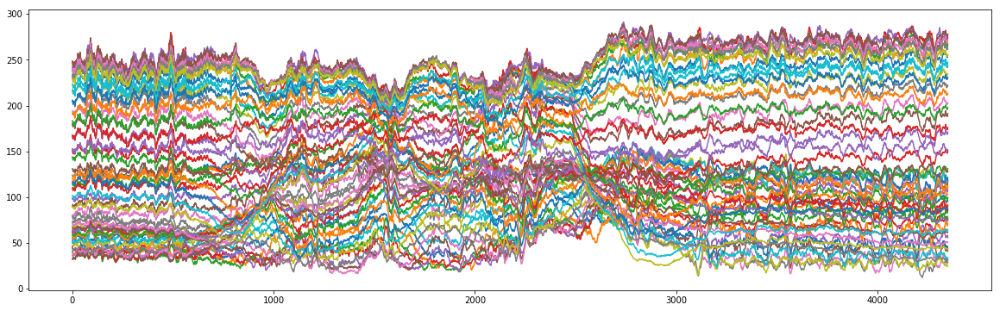

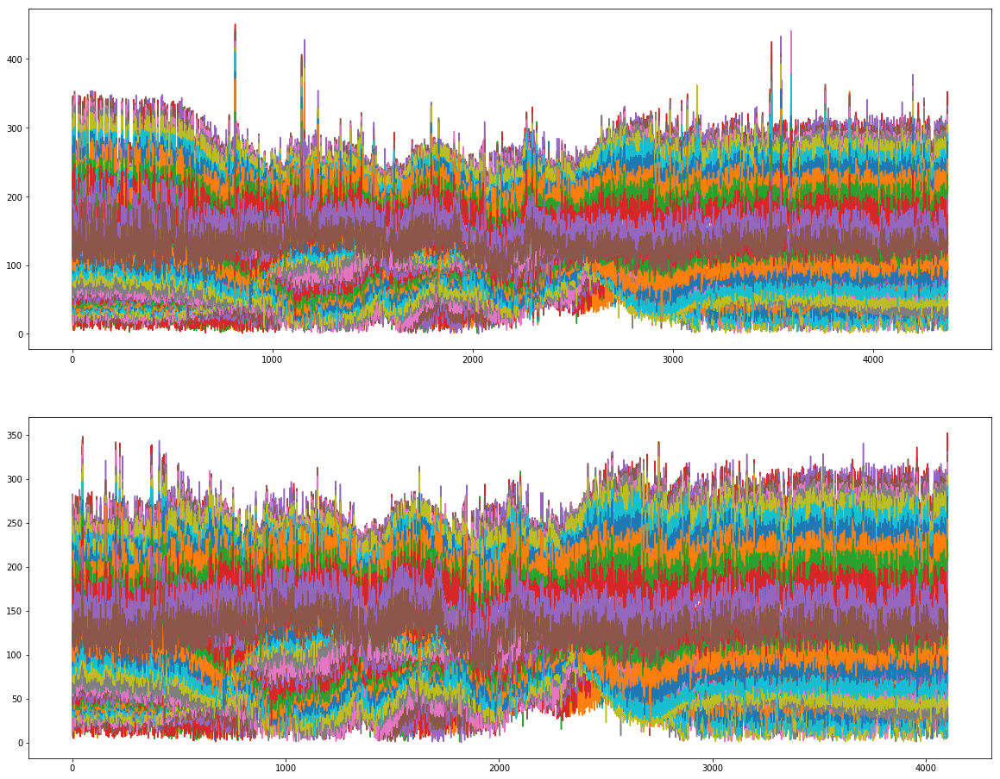

In [4]:
# data test -- don't run
TX = 1
RX = 3
data_num = 6
action = "sit"
# filename = "data/" + action + "-" + str(data_num) + "/csv" + str(TX) + "x" + str(RX) + ".csv"
filename = "testing/" + action + "-" + str(data_num) + "/csv" + str(TX) + "x" + str(RX) + ".csv"
raw = load_data(filename)
preprocess = pre_slope_std(raw)
draw(raw, preprocess)

# de-noice
de = denoice(raw)
print(de.shape)
plt.figure(1, figsize=(20,6))
f = plt.plot(de)

[4.66523310e-01 3.77131571e-01 1.14496804e-01 2.85396125e-02
 7.38922566e-03 2.25373434e-03 1.53099614e-03 9.15796820e-04
 4.16566610e-04 1.78128269e-04]
[10991.65308303  9882.63564628  5445.31516092  2718.63168724
  1383.33002553   763.97245303   629.67055702   486.99657205
   328.44947104   214.77946781]


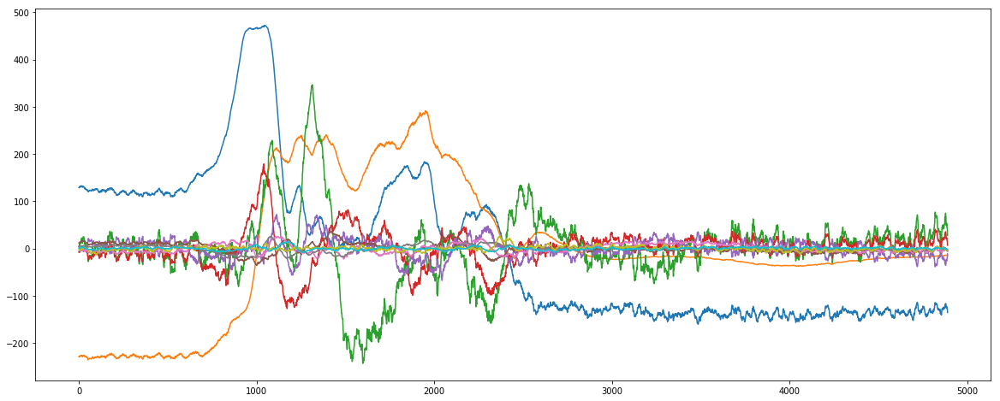

In [78]:
Pca = pca(de)
plt.figure(1, figsize=(20,8))
f = plt.plot(Pca)

(2000, 56)


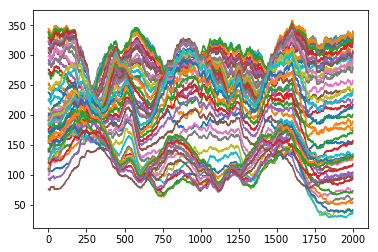

In [90]:
start = 1400
capture = de[start : start+2000]
f = plt.plot(capture)
print(capture.shape)

In [87]:
for TX in range(1, 3):
    print("TX:", TX)
    filename = "data/" + action + "-" + str(data_num) + "/csv" + str(TX) + "x" + str(RX) + ".csv"
    data_path = "capture/" + action + "-" + str(data_num)  + "-" + str(TX) + ".csv"
    # data_path = "testing/capture/" + action + "-" + str(data_num)  + "-" + str(TX) + ".csv"
    raw = load_data(filename)
    preprocess = pre_slope_std(raw)
    capture = de[start : start+2000]
    cap_save(capture, data_path)
#data_path = "capture/" + action + "-" + str(data_num)  + "-" + str(TX) + ".csv"
#cap_save(capture, data_path)

TX: 1
TX: 2


a =[]
for i in range(len(raw)-1):
    a.append(abs(raw[i,20]-raw[i+1,20]))
p = plt.plot(a)

In [14]:
# 單筆資料處理
TX = 1
RX = 3
# test folder
#filename = "test/csv" + str(TX) + "x" + str(RX) + ".csv"
# data folder
date = "0708"
action = "stand"
test_id = 2
filename = "data/" + date + "/" + action + "-" + str(test_id) + "/csv" + str(TX) + "x" +str (RX) + ".csv"
dir_path = "preprocess/" + date + "/" + action + "-" + str(test_id)
data_path = "preprocess/" + date + "/" + action + "-" + str(test_id) + "/csv" + str(TX) + "x" +str (RX) + ".csv"

In [ ]:
raw = load_data(filename)
preprocess = pre_slope_std(raw)
draw(raw, preprocess)
pre_save(preprocess, dir_path, data_path)

In [ ]:
# 連續處理
num_data = 20
RX = 3
date = "0708"
action = "stand"
for test_id in range(1, num_data + 1):
    print("id:", test_id)
    for TX in range(1, 3):
        filename = "data/" + date + "/" + action + "-" + str(test_id) + "/csv" + str(TX) + "x" +str (RX) + ".csv"
        dir_path = "preprocess/" + date + "/" + action + "-" + str(test_id)
        data_path = "preprocess/" + date + "/" + action + "-" + str(test_id) + "/csv" + str(TX) + "x" +str (RX) + ".csv"
        raw = load_data(filename)
        preprocess = pre_slope_std(raw)
        #draw(raw, preprocess)
        pre_save(preprocess, dir_path, data_path)
